In [1]:
%pylab inline
import jax
import jax.numpy as jnp
import jax_cosmo as jc

import numpyro
from numpyro.handlers import seed, trace, condition
import numpyro.distributions as dist

import tensorflow_probability as tfp; tfp = tfp.substrates.jax
tfd= tfp.distributions

import logging
logger = logging.getLogger()
class CheckTypesFilter(logging.Filter):
    def filter(self, record):
        return "check_types" not in record.getMessage()
logger.addFilter(CheckTypesFilter())
from jax.scipy.ndimage import map_coordinates
import h5py
'unset XLA_FLAGS'

from jax.config import config
config.update("jax_enable_x64", True)


import cmasher as cmr

Populating the interactive namespace from numpy and matplotlib


In [2]:
from sbi_lens.simulator.LogNormal_field import lensingLogNormal

In [3]:
#some useful functions to make the plot

def fill_lower_and_diag(array,nl):
    n = int(np.sqrt(len(array)*2))
    mask = np.arange(n)[:,None] >= np.arange(n)
    out = np.zeros((n,n,nl),dtype=float64)
    out[np.stack(mask,axis=1)] = array
    return out.T


def fill_lower_diag(array,nl):
    n = int(np.sqrt(len(array)*2))+1
    mask = np.arange(n)[:,None] > np.arange(n)
    out = np.zeros((n,n, nl),dtype=float64)
    out[np.stack(mask,axis=1)] = array
    return out.T

In [4]:
n_z_bins=5

In [5]:
fiducial_model = condition(lensingLogNormal, {'omega_c': 0.3, 'sigma_8': 0.8})
sample_map_fiducial = seed(lensingLogNormal, jax.random.PRNGKey(42))
m_data= sample_map_fiducial()

In [6]:
theta_max=5
EXTENT = (-0.5 * theta_max, 0.5 * theta_max, -0.5 * theta_max, 0.5 * theta_max)
cmap = cmr.eclipse

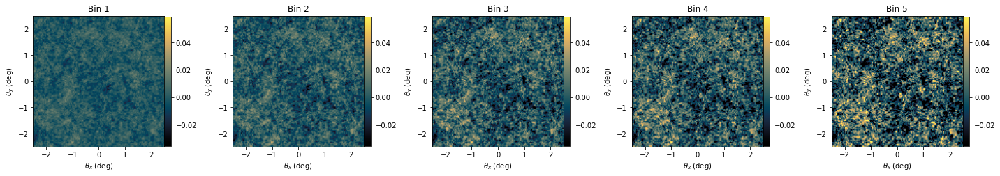

In [7]:
n_nz_bins=5
fig, ax = plt.subplots(1,n_nz_bins, figsize=(4 * n_nz_bins, 7))
for i in range(n_nz_bins):
    std_kmap = np.std(m_data[-1])
    ax[i].set_title('Bin %d'%(i+1))
    ax[i].set_xlabel(r'$\theta_x$ (deg)')
    ax[i].set_ylabel(r'$\theta_y$ (deg)')
    ax[i].imshow(m_data[i], cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT)
    cb = fig.colorbar(ax[i].imshow(m_data[i], cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT) ,fraction=0.047, pad=0.)
    cb.ax.tick_params(labelsize=10)
plt.tight_layout()
plt.show()

### Create N mock realization to average over the final angular power spectrum

Sample 1


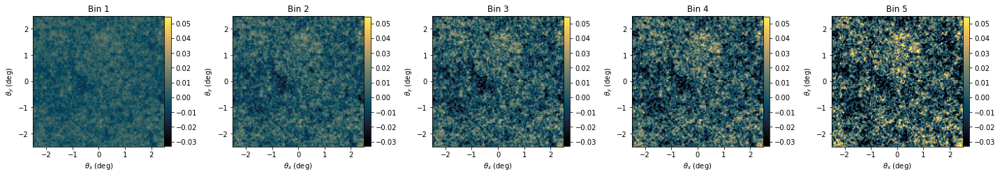

Sample 2


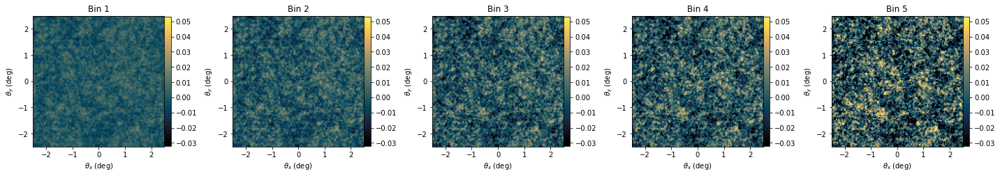

Sample 3


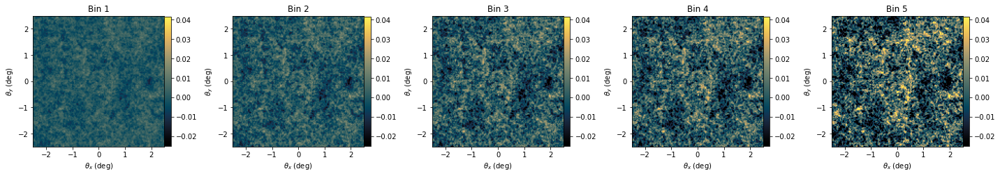

Sample 4


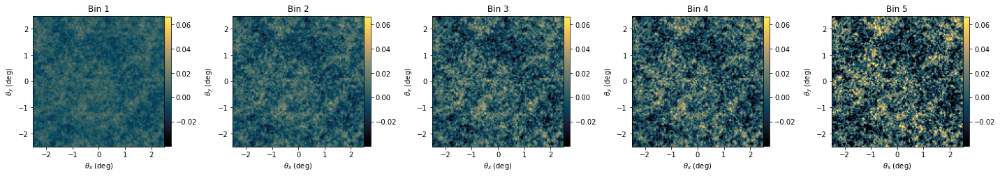

Sample 5


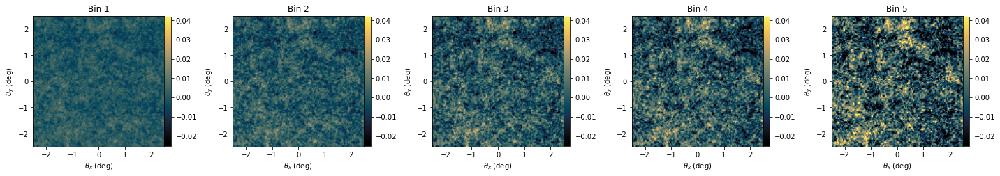

Sample 6


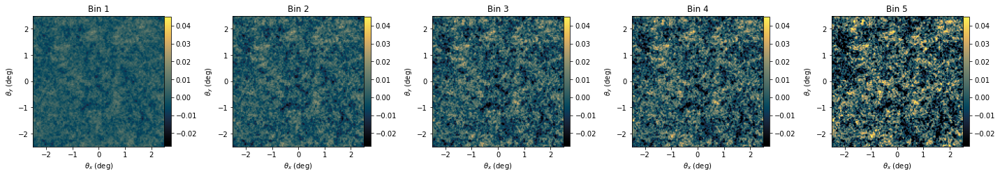

Sample 7


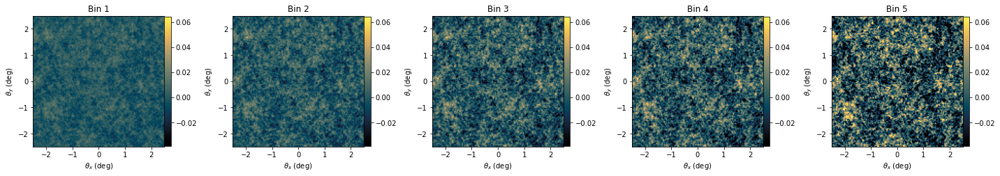

Sample 8


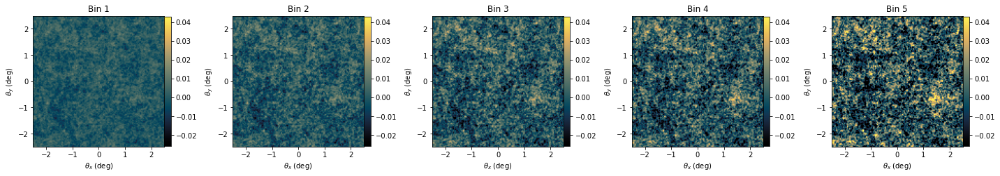

Sample 9


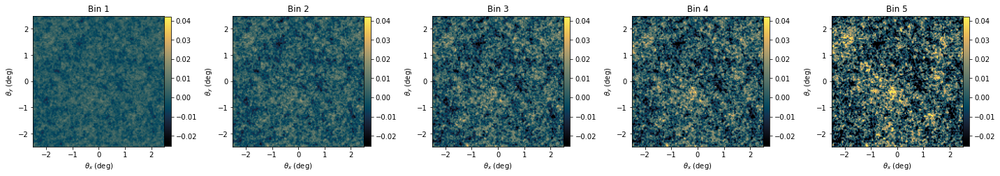

Sample 10


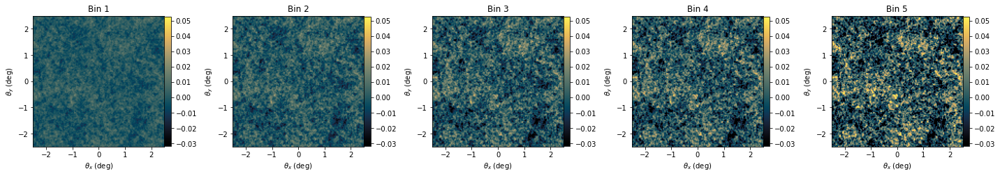

Sample 11


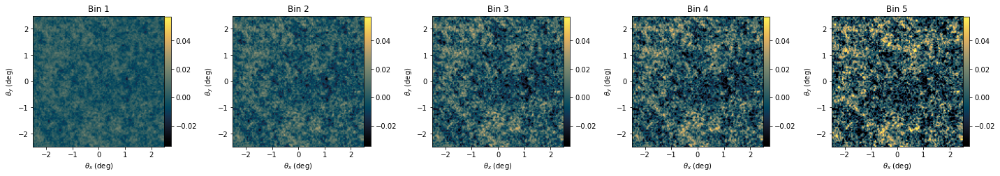

Sample 12


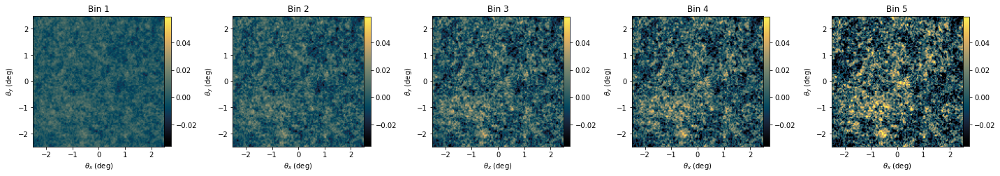

Sample 13


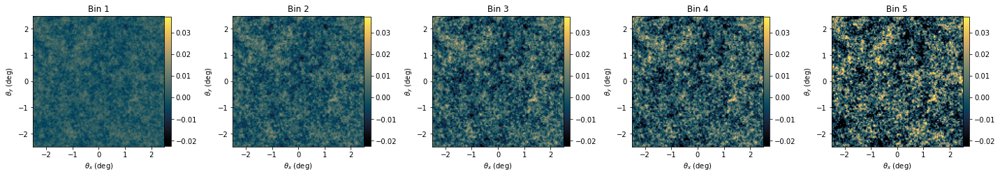

Sample 14


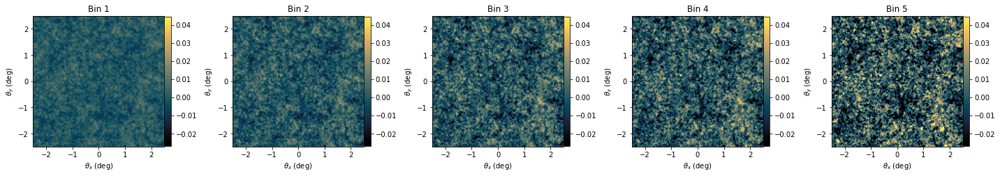

Sample 15


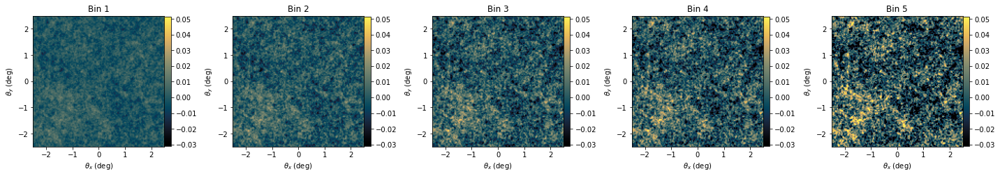

Sample 16


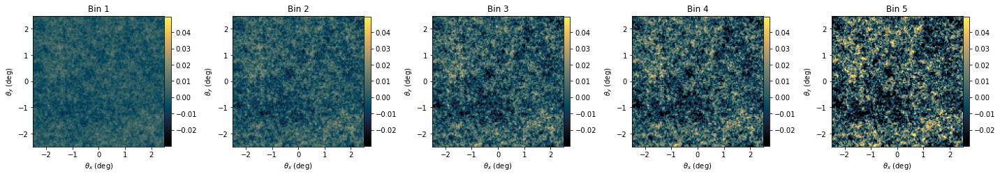

Sample 17


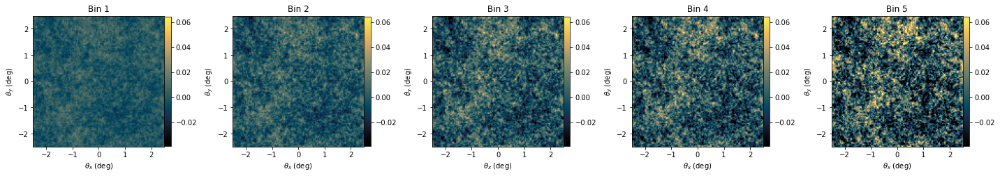

Sample 18


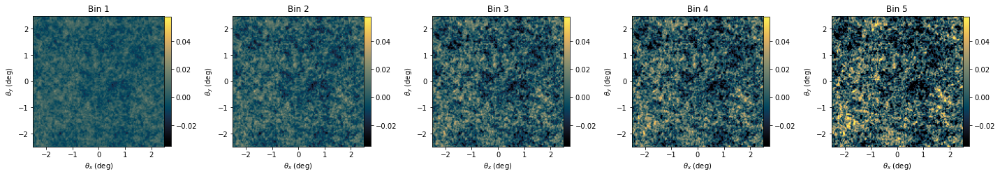

Sample 19


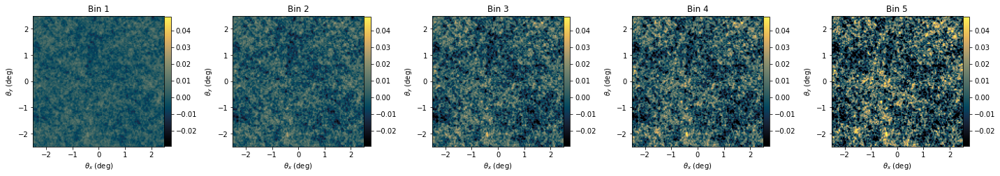

Sample 20


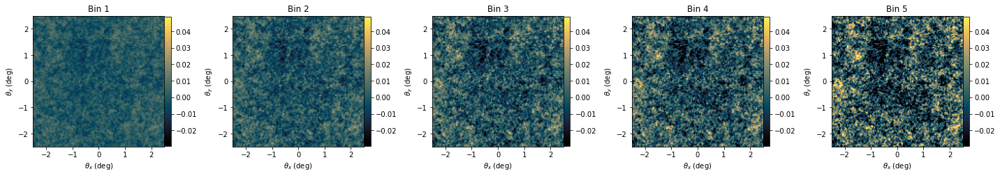

In [8]:
N_sample = 20

Cl_list = []
key=jax.random.PRNGKey(14)
for i in range(N_sample):
    print("===================================================")
    print("Sample %d"%(i+1))
    print("===================================================")
    key,subkey=jax.random.split(key)
    sample_map_fiducial = seed(lensingLogNormal, subkey)
    m_data = sample_map_fiducial()
    Cl_list.append(m_data)
    
    fig, ax = plt.subplots(1,n_nz_bins, figsize=(4 * n_nz_bins, 7))

    EXTENT = (-0.5 * theta_max, 0.5 * theta_max, -0.5 * theta_max, 0.5 * theta_max)

    for i in range(n_nz_bins):
        std_kmap = np.std(m_data[-1])
        ax[i].set_title('Bin %d'%(i+1))
        ax[i].set_xlabel(r'$\theta_x$ (deg)')
        ax[i].set_ylabel(r'$\theta_y$ (deg)')
        ax[i].imshow(m_data[i],cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT)
        cb = fig.colorbar(ax[i].imshow(m_data[i],cmap=cmap, vmin = -1.5 * std_kmap, vmax = 2.5 * std_kmap, extent=EXTENT) ,fraction=0.047, pad=0.)
        cb.ax.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()

### Compare the results with the theory

In [9]:
from lenstools import ConvergenceMap
import astropy.units as u
import itertools
import cmasher as cmr

In [12]:
with h5py.File("shear_photoz_stack.hdf5") as f:
    group = f["n_of_z"]
    source = group["source"]
    z_shear = source['z'][::]
    nz_shear = [jc.redshift.kde_nz(z_shear,  
                                   source[f"bin_{i}"][:], 
                                   bw=0.01, zmax=2.5) for i in range(5)] 


In [13]:
ell_theory = jnp.linspace(300, 5000, 128)   
cosmo = jc.Planck15(Omega_c=0.3, sigma8=0.8)
tracer = jc.probes.WeakLensing(nz_shear)
cell_theory = jc.angular_cl.angular_cl(cosmo, ell_theory, [tracer])

In [14]:
l_edges_kmap= np.linspace(300, 5000, 128)
lis=[0,1,2,3,4]
p_cross_sample=[]
for k in range(N_sample):
    m_data=Cl_list[k]
    p_cross=[]
    for i, j in itertools.combinations(lis, 2):
        pi=ConvergenceMap(m_data[i], angle=5*u.deg).cross(ConvergenceMap(m_data[j], angle=5*u.deg),l_edges=l_edges_kmap)[1]
        p_cross.append(pi)
    p_cross_sample.append(p_cross)
ell_sample=ConvergenceMap(m_data[0], angle=5*u.deg).cross(ConvergenceMap(m_data[0], angle=5*u.deg),l_edges=l_edges_kmap)[0]

In [15]:
p_auto_sample=[]
for k in range(N_sample):
    m_data=Cl_list[k]
    p_auto=[]
    for i in range(n_nz_bins):
        pi=ConvergenceMap(m_data[i], angle=5*u.deg).powerSpectrum(l_edges_kmap)[1]
        p_auto.append(pi)
    p_auto_sample.append(p_auto)

In [16]:
Cl_cross_arr = np.array(p_cross_sample)
Cl_mean_cross  = np.mean(Cl_cross_arr, axis=0)
Cl_lower_cross = np.percentile(Cl_cross_arr, 2.5, axis=0)
Cl_upper_cross = np.percentile(Cl_cross_arr, 97.5, axis=0)

In [17]:
Cl_auto_arr = np.array(p_auto_sample)
Cl_mean_auto  = np.mean(Cl_auto_arr, axis=0)
Cl_lower_auto = np.percentile(Cl_auto_arr, 2.5, axis=0)
Cl_upper_auto = np.percentile(Cl_auto_arr, 97.5, axis=0)

In [18]:
Cl_mean_sample_cross=fill_lower_diag(Cl_mean_cross,127)
Cl_lower_sample_cross=fill_lower_diag(Cl_lower_cross,127)
Cl_upper_sample_cross=fill_lower_diag(Cl_upper_cross,127)

In [19]:
Cl_mean_theory=fill_lower_and_diag(cell_theory,128)

In [20]:
col = cmr.eclipse([0.,0,0.55,0.85]) 

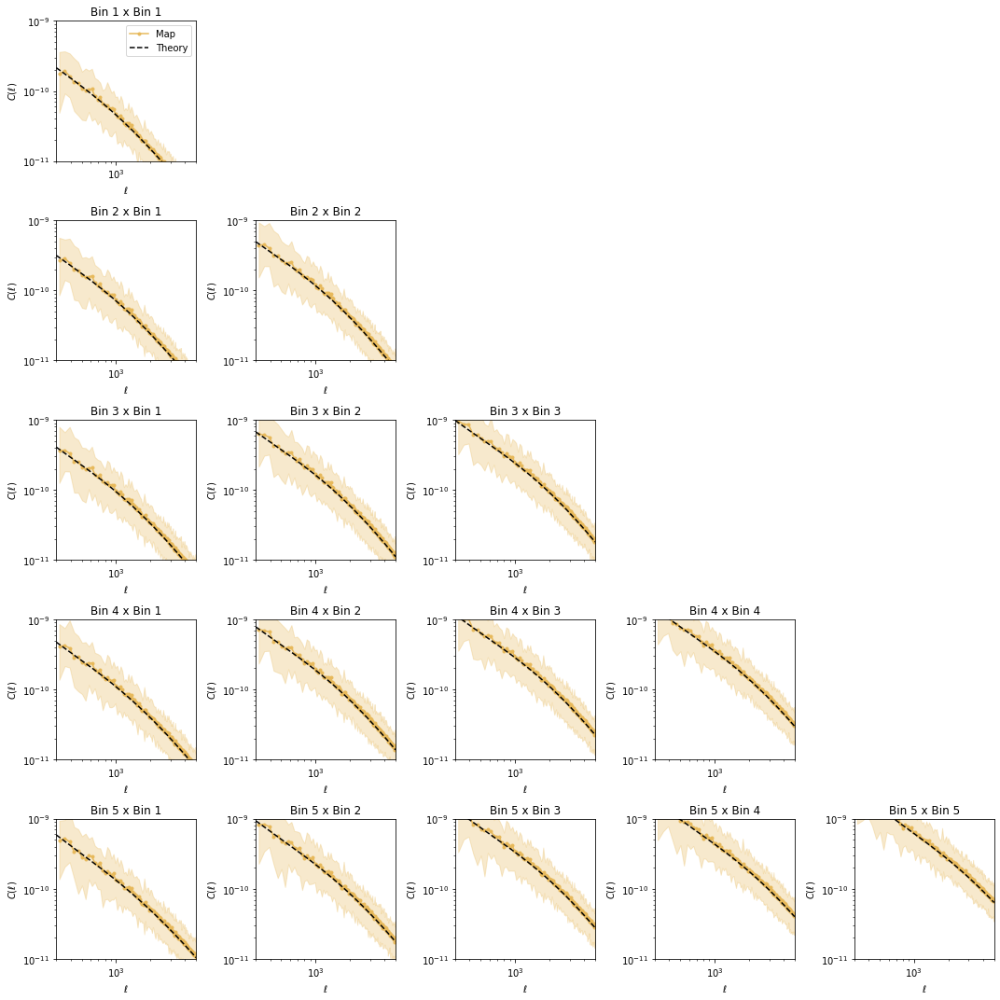

In [21]:
fig, ax = plt.subplots(n_z_bins, n_z_bins, figsize=(15,15))

for i in range(n_z_bins):
    for j in range(n_z_bins):
        if(j>i):
            ax[i,j].axis('off')
        else:
            ax[i,j].set_title('Bin %d x Bin %d'%(i+1,j+1))
            ax[i,j].set_xlabel('$\ell$')
            ax[i,j].set_ylabel('$C(\ell)$')
            ax[i,j].set_xlim(300., 5000.)
            ax[i,j].set_ylim(1e-11, 1e-9)
            if i==j:
                ax[i,j].loglog(ell_sample, Cl_mean_auto[i], '.-', color=col[3], label='Map')
                ax[i,j].loglog(ell_theory, Cl_mean_theory[:,i,j], '--',  color=col[1], label='Theory')
                ax[i,j].fill_between(ell_sample, Cl_lower_auto[i], Cl_upper_auto[i], color=col[3], alpha=0.3)
            else:
                ax[i,j].loglog(ell_sample, Cl_mean_sample_cross[:,i,j], '.-', color=col[3], label='Map')
                ax[i,j].loglog(ell_theory, Cl_mean_theory[:,i,j], '--',  color=col[1], label='Theory')
                ax[i,j].fill_between(ell_sample, Cl_lower_sample_cross[:, i,j], Cl_upper_sample_cross[:,i,j], color=col[3], alpha=0.3)

ax[0,0].legend()
plt.tight_layout()            
plt.show()   